# [microSAM](https://computational-cell-analytics.github.io/micro-sam/micro_sam.html)
see https://github.com/computational-cell-analytics/micro-sam/blob/master/examples/use_as_library/instance_segmentation.py

In [1]:
import sys, os; sys.path += [os.path.join(os.path.expanduser('~'), 'thesis')]  # NOTE hardcoded project root to find shared util modules

from micro_sam import instance_segmentation, util
import imageio.v3 as imageio
import pandas as pd
import itertools as it
import os
from datetime import datetime

from util.label_studio_converter__brush import mask2rle
from util.plot import *


_cache_dir = os.path.join(os.path.expanduser('~'), '.cache', 'micro-sam')

In [2]:
dataset_id = 'third'

models = 'vit_b vit_l vit_h vit_b_lm vit_h_lm vit_b_em vit_h_em'.split(' ')
iou_thresh = 0.88

cache_dir = os.path.join(_cache_dir, dataset_id)
os.makedirs(cache_dir, exist_ok=True)

In [3]:

out = pd.DataFrame()

for model in models:
  predictor = util.get_sam_model(model_type=model)

  for imgid in [1,2,3,4]:

    pImage = f"../data/{dataset_id}/{imgid}.jpg"
    pEmbed = f"{cache_dir}/embed.{model}.{imgid}.zarr"
    pMasks = f"{cache_dir}/masks.{model}.{imgid}.npy"
    pRLEs  = f"{cache_dir}/rles.{model}.{imgid}.str"


    if os.path.exists(pMasks):
      print(f'LOADING mask cache at {pMasks}')
      #masks = np.load(pMasks)

    else:
      image = imageio.imread(pImage)

      print('LOADING'  if os.path.exists(pEmbed) else
            'WRITING', f'embedding cache at {pEmbed}')

      embeddings = util.precompute_image_embeddings(
        predictor, image, ndim = 2, save_path=pEmbed,
        tile_shape=(tile:=1024, tile), halo=(halo:=tile//4, halo)
      )

      amg = instance_segmentation.TiledAutomaticMaskGenerator(predictor)
      amg.initialize(image, embeddings, verbose=True)
      insts = amg.generate(pred_iou_thresh=iou_thresh)  # can try different

      masks = instance_segmentation.mask_data_to_segmentation(
        insts, shape=image.shape, with_background=True)        ## TODO: what does this function do with overlapping instances?

      np.save(pMasks, masks)

      #rles = [mask2rle(I['segmentation'].astype(np.uint8)) for I in insts]
      #with open(pRLEs, 'w') as f: f.write(str(rles))

    out = pd.concat([out, pd.DataFrame(dict(
      model = [model],
      imgid = [imgid],
      image = [pImage],
      embed = [pEmbed],
      masks = [pMasks],
      rles  = [pRLEs],
    ))], ignore_index=True)

LOADING mask cache at /gpfs/space/home/eckhardt/.cache/micro-sam/third/masks.vit_b.1.npy
LOADING mask cache at /gpfs/space/home/eckhardt/.cache/micro-sam/third/masks.vit_b.2.npy
LOADING mask cache at /gpfs/space/home/eckhardt/.cache/micro-sam/third/masks.vit_b.3.npy
LOADING mask cache at /gpfs/space/home/eckhardt/.cache/micro-sam/third/masks.vit_b.4.npy


LOADING mask cache at /gpfs/space/home/eckhardt/.cache/micro-sam/third/masks.vit_l.1.npy
LOADING mask cache at /gpfs/space/home/eckhardt/.cache/micro-sam/third/masks.vit_l.2.npy
LOADING mask cache at /gpfs/space/home/eckhardt/.cache/micro-sam/third/masks.vit_l.3.npy
LOADING mask cache at /gpfs/space/home/eckhardt/.cache/micro-sam/third/masks.vit_l.4.npy


LOADING mask cache at /gpfs/space/home/eckhardt/.cache/micro-sam/third/masks.vit_h.1.npy
LOADING mask cache at /gpfs/space/home/eckhardt/.cache/micro-sam/third/masks.vit_h.2.npy
LOADING mask cache at /gpfs/space/home/eckhardt/.cache/micro-sam/third/masks.vit_h.3.npy
LOADING mask cache at /gpfs/space/home/eckhardt/.cache/micro-sam/third/masks.vit_h.4.npy


LOADING mask cache at /gpfs/space/home/eckhardt/.cache/micro-sam/third/masks.vit_b_lm.1.npy
LOADING mask cache at /gpfs/space/home/eckhardt/.cache/micro-sam/third/masks.vit_b_lm.2.npy
LOADING mask cache at /gpfs/space/home/eckhardt/.cache/micro-sam/third/masks.vit_b_lm.3.npy
LOADING mask cache at /gpfs/space/home/eckhardt/.cache/micro-sam/third/masks.vit_b_lm.4.npy


LOADING mask cache at /gpfs/space/home/eckhardt/.cache/micro-sam/third/masks.vit_h_lm.1.npy
LOADING mask cache at /gpfs/space/home/eckhardt/.cache/micro-sam/third/masks.vit_h_lm.2.npy
LOADING mask cache at /gpfs/space/home/eckhardt/.cache/micro-sam/third/masks.vit_h_lm.3.npy
LOADING mask cache at /gpfs/space/home/eckhardt/.cache/micro-sam/third/masks.vit_h_lm.4.npy


LOADING mask cache at /gpfs/space/home/eckhardt/.cache/micro-sam/third/masks.vit_b_em.1.npy
LOADING mask cache at /gpfs/space/home/eckhardt/.cache/micro-sam/third/masks.vit_b_em.2.npy
LOADING mask cache at /gpfs/space/home/eckhardt/.cache/micro-sam/third/masks.vit_b_em.3.npy
LOADING mask cache at /gpfs/space/home/eckhardt/.cache/micro-sam/third/masks.vit_b_em.4.npy


LOADING mask cache at /gpfs/space/home/eckhardt/.cache/micro-sam/third/masks.vit_h_em.1.npy
LOADING mask cache at /gpfs/space/home/eckhardt/.cache/micro-sam/third/masks.vit_h_em.2.npy
LOADING mask cache at /gpfs/space/home/eckhardt/.cache/micro-sam/third/masks.vit_h_em.3.npy
LOADING mask cache at /gpfs/space/home/eckhardt/.cache/micro-sam/third/masks.vit_h_em.4.npy


In [4]:
out

,model,imgid,image,embed,masks,rles
0,vit_b,1,../data/third/1.jpg,/gpfs/space/home/eckhardt/.cache/micro-sam/thi...,/gpfs/space/home/eckhardt/.cache/micro-sam/thi...,/gpfs/space/home/eckhardt/.cache/micro-sam/thi...
1,vit_b,2,../data/third/2.jpg,/gpfs/space/home/eckhardt/.cache/micro-sam/thi...,/gpfs/space/home/eckhardt/.cache/micro-sam/thi...,/gpfs/space/home/eckhardt/.cache/micro-sam/thi...
2,vit_b,3,../data/third/3.jpg,/gpfs/space/home/eckhardt/.cache/micro-sam/thi...,/gpfs/space/home/eckhardt/.cache/micro-sam/thi...,/gpfs/space/home/eckhardt/.cache/micro-sam/thi...
3,vit_b,4,../data/third/4.jpg,/gpfs/space/home/eckhardt/.cache/micro-sam/thi...,/gpfs/space/home/eckhardt/.cache/micro-sam/thi...,/gpfs/space/home/eckhardt/.cache/micro-sam/thi...
4,vit_l,1,../data/third/1.jpg,/gpfs/space/home/eckhardt/.cache/micro-sam/thi...,/gpfs/space/home/eckhardt/.cache/micro-sam/thi...,/gpfs/space/home/eckhardt/.cache/micro-sam/thi...
5,vit_l,2,../data/third/2.jpg,/gpfs/space/home/eckhardt/.cache/micro-sam/thi...,/gpfs/space/home/eckhardt/.cache/micro-sam/thi...,/gpfs/space/home/eckhardt/.cache/micro-sam/thi...
6,vit_l,3,../data/third/3.jpg,/gpfs/space/home/eckhardt/.cache/micro-sam/thi...,/gpfs/space/home/eckhardt/.cache/micro-sam/thi...,/gpfs/space/home/eckhardt/.cache/micro-sam/thi...
7,vit_l,4,../data/third/4.jpg,/gpfs/space/home/eckhardt/.cache/micro-sam/thi...,/gpfs/space/home/eckhardt/.cache/micro-sam/thi...,/gpfs/space/home/eckhardt/.cache/micro-sam/thi...
8,vit_h,1,../data/third/1.jpg,/gpfs/space/home/eckhardt/.cache/micro-sam/thi...,/gpfs/space/home/eckhardt/.cache/micro-sam/thi...,/gpfs/space/home/eckhardt/.cache/micro-sam/thi...
9,vit_h,2,../data/third/2.jpg,/gpfs/space/home/eckhardt/.cache/micro-sam/thi...,/gpfs/space/home/eckhardt/.cache/micro-sam/thi...,/gpfs/space/home/eckhardt/.cache/micro-sam/thi...


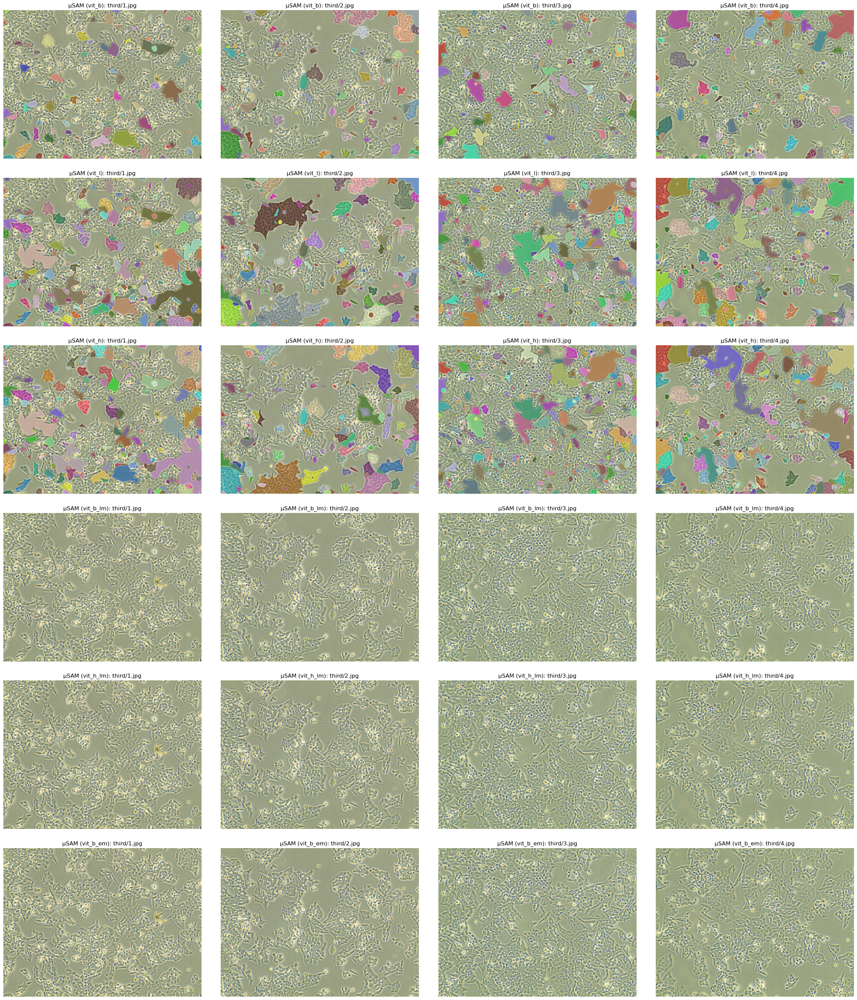

In [5]:
colors = colorcet.m_glasbey.colors

fig, axs = plt.subplots(6, 4, figsize=(13*4/2, 10*6/2))
plt.tight_layout()

for ax, (_, it) in zip(axs.flat, out.iterrows()):
  image = imageio.imread(it['image'])
  masks = np.load(it['masks'])

  ax.set_title(f"µSAM ({it['model']}): third/{it['imgid']}.jpg")
  ax.axis('off')

  ax.imshow(skimage.color.label2rgb(
    masks, image, saturation=1, bg_color=None, alpha=0.5, colors=colors)
  )